# Disease Classification in Potato Plants

#### Group Members

1. Muhammad Moaaz bin Sajjad (20k-0154)
2. Syed Huzaifa bin Jawad (20k-0175)
3. Murtaza Salman (20k-0398)

#### Description

The primary objective of this project is to leverage deep learning techniques to classify images of potato plants into three categories: Early Blight, Late Blight, and Healthy. The goal is to determine which model architecture is most effective at identifying and differentiating between these plant conditions.

## Custom Model

In [1]:
import tensorflow as tf
from tensorflow.keras import models, layers
import matplotlib.pyplot as plt
import math

In [43]:
BATCH_SIZE = 32
IMAGE_SIZE = 256
CHANNELS=3
EPOCHS=30

In [3]:
dataset = tf.keras.preprocessing.image_dataset_from_directory(
    "Plant_Village",
    seed=123,
    shuffle=True,
    image_size=(IMAGE_SIZE,IMAGE_SIZE),
    batch_size=BATCH_SIZE
)

Found 2152 files belonging to 3 classes.


In [4]:
class_names = dataset.class_names
class_names

['Potato___Early_blight', 'Potato___Late_blight', 'Potato___healthy']

In [5]:
for image_batch, labels_batch in dataset.take(1):
    print(image_batch.shape)
    print(labels_batch.numpy())

(32, 256, 256, 3)
[1 1 1 0 0 0 0 0 1 1 1 1 0 1 0 1 1 1 0 1 0 1 0 0 1 0 0 1 1 2 0 0]


In [6]:
for image_batch, labels_batch in dataset.take(1):
    print(image_batch[0].shape)

(256, 256, 3)


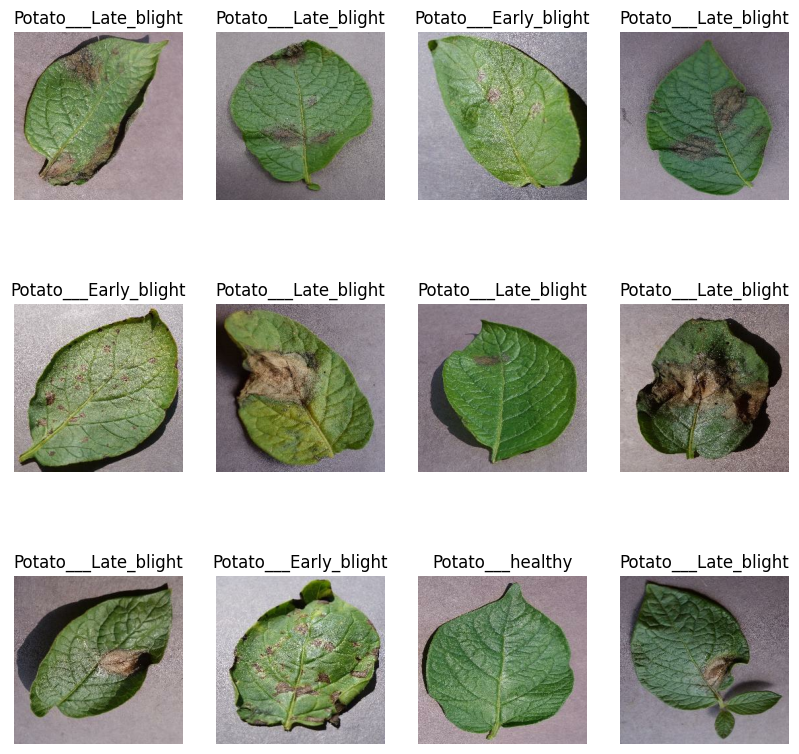

In [7]:
plt.figure(figsize=(10, 10))
for image_batch, labels_batch in dataset.take(1):
    for i in range(12):
        ax = plt.subplot(3, 4, i + 1)
        plt.imshow(image_batch[i].numpy().astype("uint8")) #Convert into float 
        plt.title(class_names[labels_batch[i]])
        plt.axis("off")

In [8]:
train_size = 0.8
len(dataset)*train_size

54.400000000000006

In [9]:
train_ds = dataset.take(54)
len(train_ds)

54

In [10]:
train_ds = dataset.take(math.floor(len(train_ds)))
len(train_ds)

54

In [11]:
test_ds = dataset.skip(math.floor(len(train_ds)))
len(test_ds)

14

In [12]:
val_size=0.1
x=len(dataset)*val_size
print(x)

6.800000000000001


In [13]:
val_ds = test_ds.take(math.floor(x))
len(val_ds)

6

In [14]:
test_ds = test_ds.skip(len(val_ds))
len(test_ds)

8

In [15]:
def get_dataset_partitions_tf(ds, train_split=0.8, val_split=0.1, test_split=0.1, shuffle=True, shuffle_size=10000):
    assert (train_split + test_split + val_split) == 1
    
    ds_size = len(ds)
    
    if shuffle:
        ds = ds.shuffle(shuffle_size, seed=12)
    
    train_size = int(train_split * ds_size)
    val_size = int(val_split * ds_size)
    
    train_ds = ds.take(train_size)    
    val_ds = ds.skip(train_size).take(val_size)
    test_ds = ds.skip(train_size).skip(val_size)
    
    return train_ds, val_ds, test_ds

In [16]:
train_ds, val_ds, test_ds = get_dataset_partitions_tf(dataset)

In [17]:
len(train_ds)

54

In [18]:
len(val_ds)

6

In [19]:
len(test_ds)

8

In [20]:
train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
val_ds = val_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
test_ds = test_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)

In [21]:
resize_and_rescale = tf.keras.Sequential([
  tf.keras.layers.Resizing(IMAGE_SIZE, IMAGE_SIZE),
  tf.keras.layers.Rescaling(1./255),
])

In [22]:
import tensorflow as tf

data_augmentation = tf.keras.Sequential([
  tf.keras.layers.RandomFlip("horizontal_and_vertical"),
  tf.keras.layers.RandomRotation(0.2),
])

In [23]:
train_ds = train_ds.map(
    lambda x, y: (data_augmentation(x, training=True), y)
).prefetch(buffer_size=tf.data.AUTOTUNE)

In [24]:
input_shape = (BATCH_SIZE, IMAGE_SIZE, IMAGE_SIZE, CHANNELS)
n_classes = 3

model1 = models.Sequential([
    resize_and_rescale,
    layers.Conv2D(32, kernel_size = (3,3), activation='relu', input_shape=input_shape),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64,  kernel_size = (3,3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64,  kernel_size = (3,3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Flatten(),
    layers.Dense(64, activation='relu'),
    layers.Dense(n_classes, activation='softmax'),
])

model1.build(input_shape=input_shape)

C:\Users\LENOVO\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [25]:
model1.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ sequential (Sequential)              │ (32, 256, 256, 3)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d (Conv2D)                      │ (32, 254, 254, 32)          │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (32, 127, 127, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (32, 125, 125, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (32, 62, 62, 64)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (32, 60, 60, 64)            │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (32, 30, 30, 64)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (32, 28, 28, 64)            │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (32, 14, 14, 64)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (32, 12, 12, 64)            │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_4 (MaxPooling2D)       │ (32, 6, 6, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_5 (Conv2D)                    │ (32, 4, 4, 64)              │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_5 (MaxPooling2D)       │ (32, 2, 2, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (32, 256)                   │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (32, 64)                    │          16,448 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (32, 3)                     │             195 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 183,747 (717.76 KB)

 Trainable params: 183,747 (717.76 KB)

 Non-trainable params: 0 (0.00 B)

In [26]:
model1.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics=['accuracy']
)

In [27]:
history1 = model1.fit(
    train_ds,
    batch_size=BATCH_SIZE,
    validation_data=val_ds,
    verbose=1,
    epochs=30,
)

Epoch 1/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 56s 959ms/step - accuracy: 0.4968 - loss: 0.9381 - val_accuracy: 0.4531 - val_loss: 0.9358
Epoch 2/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 49s 898ms/step - accuracy: 0.5465 - loss: 0.8615 - val_accuracy: 0.7500 - val_loss: 0.5640
Epoch 3/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 48s 889ms/step - accuracy: 0.7368 - loss: 0.6163 - val_accuracy: 0.7969 - val_loss: 0.4766
Epoch 4/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 49s 900ms/step - accuracy: 0.8162 - loss: 0.4348 - val_accuracy: 0.8854 - val_loss: 0.2994
Epoch 5/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 48s 888ms/step - accuracy: 0.8699 - loss: 0.3156 - val_accuracy: 0.9062 - val_loss: 0.2316
Epoch 6/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 52s 959ms/step - accuracy: 0.9049 - loss: 0.2484 - val_accuracy: 0.8958 - val_loss: 0.2450
Epoch 7/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 55s 1s/step - accuracy: 0.9227 - loss: 0.2000 - val_accuracy: 0.9167 - val_loss: 0.2046
Epoch 8/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 54s 1000ms/step - accuracy: 0.9130 - loss: 0.2051 - val_accura

In [29]:
scores = model1.evaluate(test_ds)

8/8 ━━━━━━━━━━━━━━━━━━━━ 3s 210ms/step - accuracy: 0.9664 - loss: 0.1013


In [30]:
scores


[0.1030217856168747, 0.96484375]

In [32]:
history1.params


{'verbose': 1, 'epochs': 30, 'steps': 54}

In [33]:
history1.history.keys()


dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [34]:
type(history1.history['loss'])


list

In [35]:
len(history1.history['loss'])


30

In [36]:
history1.history['loss'][:5] # show loss for first 5 epochs


[0.9241085052490234,
 0.7969861030578613,
 0.6278558373451233,
 0.3993963897228241,
 0.29093578457832336]

In [38]:
acc = history1.history['accuracy']
val_acc = history1.history['val_accuracy']

loss = history1.history['loss']
val_loss = history1.history['val_loss']

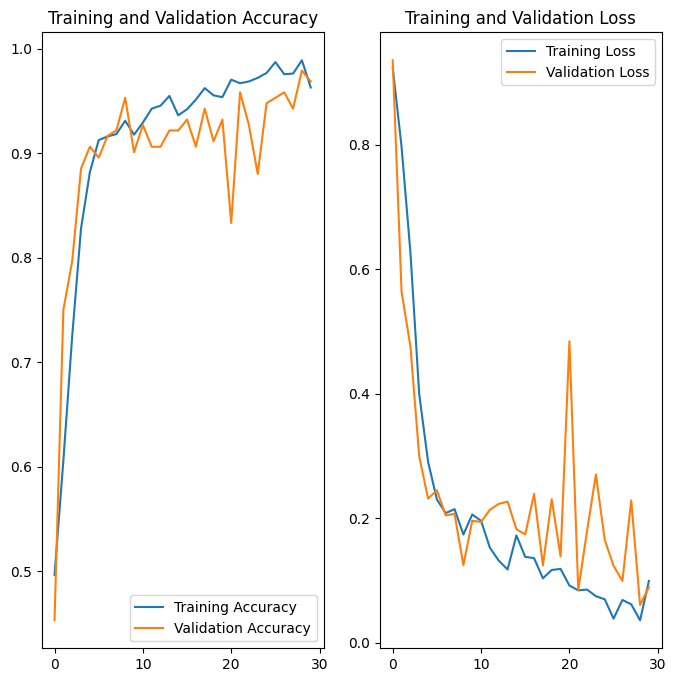

In [44]:
plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(range(EPOCHS), acc, label='Training Accuracy')
plt.plot(range(EPOCHS), val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(range(EPOCHS), loss, label='Training Loss')
plt.plot(range(EPOCHS), val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

first image to predict
actual label: Potato___healthy
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step
predicted label: Potato___healthy


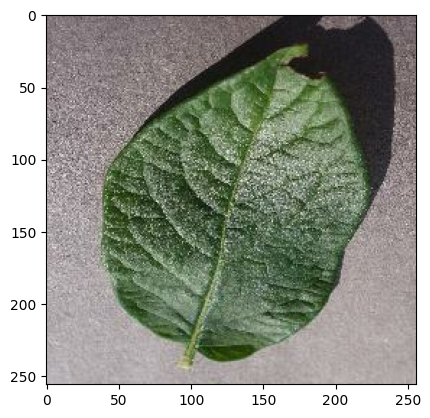

In [46]:
import numpy as np
for images_batch, labels_batch in test_ds.take(1):
    
    first_image = images_batch[0].numpy().astype('uint8')
    first_label = labels_batch[0].numpy()
    
    print("first image to predict")
    plt.imshow(first_image)
    print("actual label:",class_names[first_label])
    
    batch_prediction = model1.predict(images_batch)
    print("predicted label:",class_names[np.argmax(batch_prediction[0])])

In [48]:
import numpy as np

def predict(model, img):
    img_array = tf.keras.preprocessing.image.img_to_array(images[i].numpy())
    img_array = tf.expand_dims(img_array, 0)

    predictions = model.predict(img_array)

    predicted_class = class_names[np.argmax(predictions[0])]
    confidence = round(100 * (np.max(predictions[0])), 2)
    return predicted_class, confidence

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


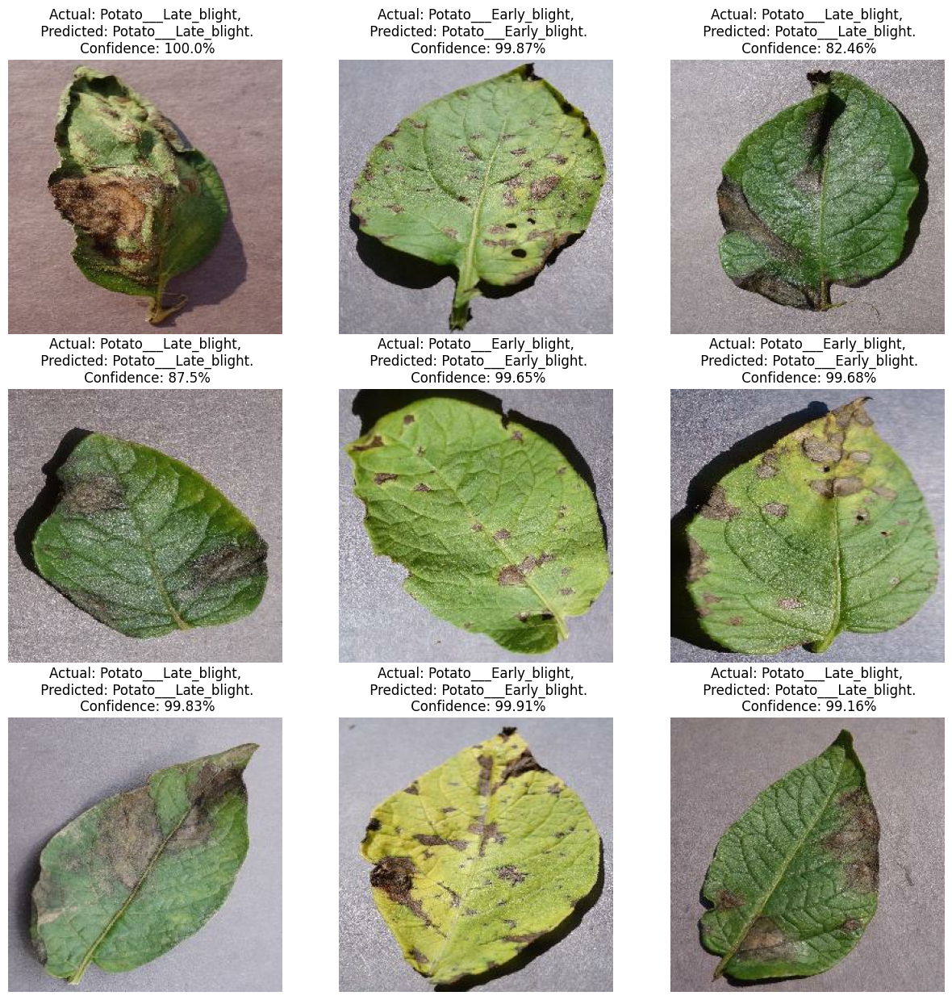

In [49]:
plt.figure(figsize=(15, 15))
for images, labels in test_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        
        predicted_class, confidence = predict(model1, images[i].numpy())
        actual_class = class_names[labels[i]] 
        
        plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class}.\n Confidence: {confidence}%")
        
        plt.axis("off")

In [52]:
model1.save("model1.keras")

## LeNet-5

In [66]:
model_lenet5 = models.Sequential([
    resize_and_rescale,
    layers.Conv2D(6, (5, 5), padding='same', activation='relu', input_shape=(256, 256, 3)),
    layers.AveragePooling2D((2,2)),
    layers.Conv2D(16, (5, 5), activation='relu'),
    layers.AveragePooling2D((2,2)),
    layers.Flatten(),
    layers.Dense(120, activation='relu'),
    layers.Dense(84, activation='relu'),
    layers.Dense(3, activation='softmax')
])

In [67]:
model_lenet5.build(input_shape=(BATCH_SIZE, IMAGE_SIZE, IMAGE_SIZE, CHANNELS))



In [68]:
model_lenet5.summary()


Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ sequential (Sequential)              │ (32, 256, 256, 3)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_26 (Conv2D)                   │ (32, 256, 256, 6)           │             456 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ average_pooling2d_2                  │ (32, 128, 128, 6)           │               0 │
│ (AveragePooling2D)                   │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_27 (Conv2D)                   │ (32, 124, 124, 16)          │           2,416 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ average_pooling2d_3                  │ (32, 62, 62, 16)            │               0 │
│ (AveragePooling2D)                   │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_5 (Flatten)                  │ (32, 61504)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_10 (Dense)                     │ (32, 120)                   │       7,380,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_11 (Dense)                     │ (32, 84)                    │          10,164 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_12 (Dense)                     │ (32, 3)                     │             255 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,393,891 (28.21 MB)

 Trainable params: 7,393,891 (28.21 MB)

 Non-trainable params: 0 (0.00 B)

In [77]:
model_lenet5.compile(optimizer='adam',
                     loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
                     metrics=['accuracy'])


In [78]:
history_lenet5 = model_lenet5.fit(
    train_ds,
    validation_data=val_ds,
    epochs=EPOCHS,
    batch_size=32,  # Note: Batch size is often handled in the dataset, might not be needed here
    verbose=1
)

Epoch 1/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 23s 382ms/step - accuracy: 0.4924 - loss: 3.1743 - val_accuracy: 0.7812 - val_loss: 0.5482
Epoch 2/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 20s 376ms/step - accuracy: 0.8167 - loss: 0.4909 - val_accuracy: 0.8646 - val_loss: 0.3107
Epoch 3/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 21s 380ms/step - accuracy: 0.8526 - loss: 0.3426 - val_accuracy: 0.9062 - val_loss: 0.2110
Epoch 4/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 21s 379ms/step - accuracy: 0.8827 - loss: 0.2537 - val_accuracy: 0.8698 - val_loss: 0.2951
Epoch 5/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 20s 376ms/step - accuracy: 0.8910 - loss: 0.2722 - val_accuracy: 0.9271 - val_loss: 0.1852
Epoch 6/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 20s 375ms/step - accuracy: 0.9097 - loss: 0.2368 - val_accuracy: 0.9323 - val_loss: 0.1555
Epoch 7/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 20s 375ms/step - accuracy: 0.9262 - loss: 0.1858 - val_accuracy: 0.8177 - val_loss: 0.4718
Epoch 8/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 21s 378ms/step - accuracy: 0.8954 - loss: 0.2477 - val_accu

In [79]:
# Assuming 'test_ds' is your test dataset prepared in a similar manner to train and validation datasets
scores_lenet5 = model_lenet5.evaluate(test_ds)
print("Test Loss, Test Accuracy:", scores_lenet5)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - accuracy: 0.9469 - loss: 0.1365
Test Loss, Test Accuracy: [0.1286681741476059, 0.94921875]


In [80]:
print("Training parameters: ", history_lenet5.params)
print("Available history keys: ", history_lenet5.history.keys())
print("Type of loss history: ", type(history_lenet5.history['loss']))
print("Length of loss history: ", len(history_lenet5.history['loss']))
print("First 5 epochs' losses: ", history_lenet5.history['loss'][:5])

acc_lenet5 = history_lenet5.history['accuracy']
val_acc_lenet5 = history_lenet5.history['val_accuracy']
loss_lenet5 = history_lenet5.history['loss']
val_loss_lenet5 = history_lenet5.history['val_loss']


Training parameters:  {'verbose': 1, 'epochs': 30, 'steps': 54}
Available history keys:  dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])
Type of loss history:  <class 'list'>
Length of loss history:  30
First 5 epochs' losses:  [1.592134952545166, 0.44526997208595276, 0.34494855999946594, 0.2757951021194458, 0.25266575813293457]


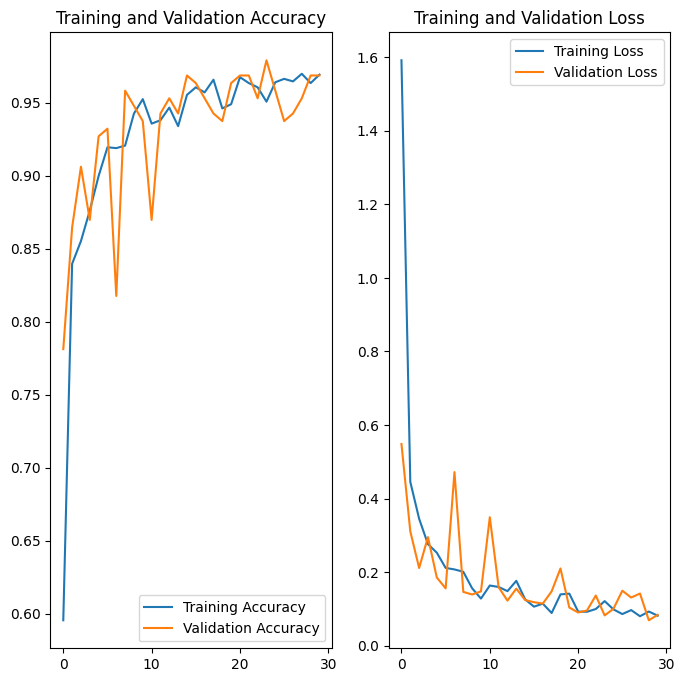

In [81]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(range(EPOCHS), acc_lenet5, label='Training Accuracy')
plt.plot(range(EPOCHS), val_acc_lenet5, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(range(EPOCHS), loss_lenet5, label='Training Loss')
plt.plot(range(EPOCHS), val_loss_lenet5, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


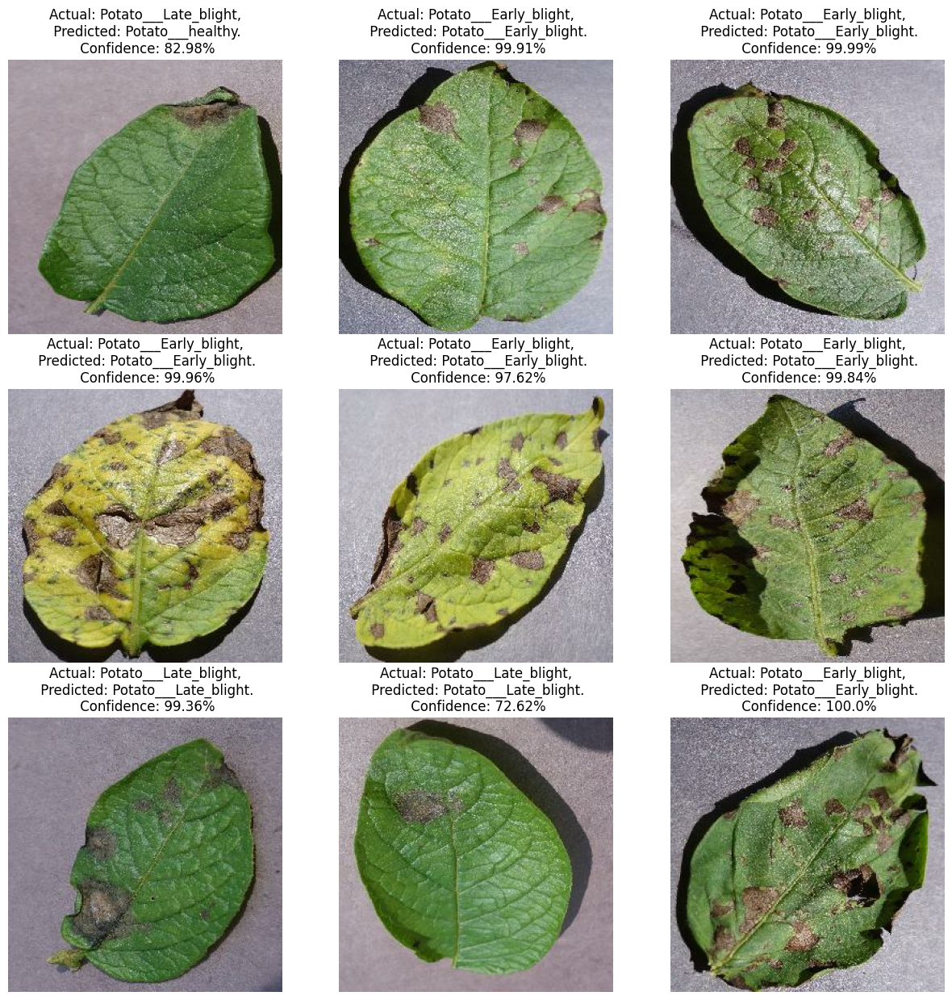

In [94]:
plt.figure(figsize=(15, 15))
for images, labels in test_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        
        predicted_class, confidence = predict(model_lenet5, images[i].numpy())
        actual_class = class_names[labels[i]] 
        
        plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class}.\n Confidence: {confidence}%")
        plt.axis("off")

In [83]:
model_lenet5.save("lenet5_model.keras")


## AlexNet

In [70]:
# AlexNet for (256, 256, 3) images
model_alexnet = models.Sequential([
    resize_and_rescale,
    layers.Conv2D(96, (11, 11), strides=4, activation='relu', input_shape=(256, 256, 3)),
    layers.MaxPooling2D((3, 3), strides=2),
    layers.Conv2D(256, (5, 5), padding='same', activation='relu'),
    layers.MaxPooling2D((3, 3), strides=2),
    layers.Conv2D(384, (3, 3), padding='same', activation='relu'),
    layers.Conv2D(384, (3, 3), padding='same', activation='relu'),
    layers.Conv2D(256, (3, 3), padding='same', activation='relu'),
    layers.MaxPooling2D((3, 3), strides=2),
    layers.Flatten(),
    layers.Dense(4096, activation='relu'),
    layers.Dropout(0.5),
    layers.Dense(4096, activation='relu'),
    layers.Dropout(0.5),
    layers.Dense(3, activation='softmax')
])


In [71]:
model_alexnet.build(input_shape=(BATCH_SIZE, IMAGE_SIZE, IMAGE_SIZE, CHANNELS))


In [72]:
model_alexnet.summary()


Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ sequential (Sequential)              │ (32, 256, 256, 3)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_28 (Conv2D)                   │ (32, 62, 62, 96)            │          34,944 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_11 (MaxPooling2D)      │ (32, 30, 30, 96)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_29 (Conv2D)                   │ (32, 30, 30, 256)           │         614,656 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_12 (MaxPooling2D)      │ (32, 14, 14, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_30 (Conv2D)                   │ (32, 14, 14, 384)           │         885,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_31 (Conv2D)                   │ (32, 14, 14, 384)           │       1,327,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_32 (Conv2D)                   │ (32, 14, 14, 256)           │         884,992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_13 (MaxPooling2D)      │ (32, 6, 6, 256)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_6 (Flatten)                  │ (32, 9216)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_13 (Dense)                     │ (32, 4096)                  │      37,752,832 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (32, 4096)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_14 (Dense)                     │ (32, 4096)                  │      16,781,312 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (32, 4096)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_15 (Dense)                     │ (32, 3)                     │          12,291 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 58,293,635 (222.37 MB)

 Trainable params: 58,293,635 (222.37 MB)

 Non-trainable params: 0 (0.00 B)

In [85]:
model_alexnet.compile(optimizer='adam',
                      loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
                      metrics=['accuracy'])

In [87]:
history_alexnet = model_alexnet.fit(
    train_ds,
    validation_data=val_ds,
    epochs=EPOCHS,
    batch_size=32,  
    verbose=1
)

Epoch 1/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 95s 2s/step - accuracy: 0.4426 - loss: 0.9175 - val_accuracy: 0.4688 - val_loss: 0.9157
Epoch 2/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 92s 2s/step - accuracy: 0.4612 - loss: 0.9037 - val_accuracy: 0.4531 - val_loss: 0.9145
Epoch 3/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 93s 2s/step - accuracy: 0.4805 - loss: 0.9051 - val_accuracy: 0.4688 - val_loss: 0.9135
Epoch 4/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 91s 2s/step - accuracy: 0.4750 - loss: 0.9125 - val_accuracy: 0.4688 - val_loss: 0.9142
Epoch 5/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 91s 2s/step - accuracy: 0.4818 - loss: 0.9236 - val_accuracy: 0.4531 - val_loss: 0.9170
Epoch 6/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 92s 2s/step - accuracy: 0.4599 - loss: 0.9103 - val_accuracy: 0.4688 - val_loss: 0.9140
Epoch 7/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 91s 2s/step - accuracy: 0.4760 - loss: 0.8937 - val_accuracy: 0.4688 - val_loss: 0.9136
Epoch 8/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 95s 2s/step - accuracy: 0.4302 - loss: 0.9216 - val_accuracy: 0.4688 - val_loss:

In [89]:
# Evaluate the AlexNet model on the test dataset
scores_alexnet = model_alexnet.evaluate(test_ds)
print("Test Loss, Test Accuracy:", scores_alexnet)


8/8 ━━━━━━━━━━━━━━━━━━━━ 76s 10s/step - accuracy: 0.4225 - loss: 0.9233
Test Loss, Test Accuracy: [0.9257667660713196, 0.43359375]


In [90]:
# Display training parameters and access the training history for AlexNet
print("Training parameters: ", history_alexnet.params)
print("Available history keys: ", history_alexnet.history.keys())
print("Type of loss history: ", type(history_alexnet.history['loss']))
print("Length of loss history: ", len(history_alexnet.history['loss']))
print("First 5 epochs' losses: ", history_alexnet.history['loss'][:5])

acc_alexnet = history_alexnet.history['accuracy']
val_acc_alexnet = history_alexnet.history['val_accuracy']
loss_alexnet = history_alexnet.history['loss']
val_loss_alexnet = history_alexnet.history['val_loss']


Training parameters:  {'verbose': 1, 'epochs': 30, 'steps': 54}
Available history keys:  dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])
Type of loss history:  <class 'list'>
Length of loss history:  30
First 5 epochs' losses:  [0.9079108238220215, 0.907849907875061, 0.9089711308479309, 0.9066570997238159, 0.9077469706535339]


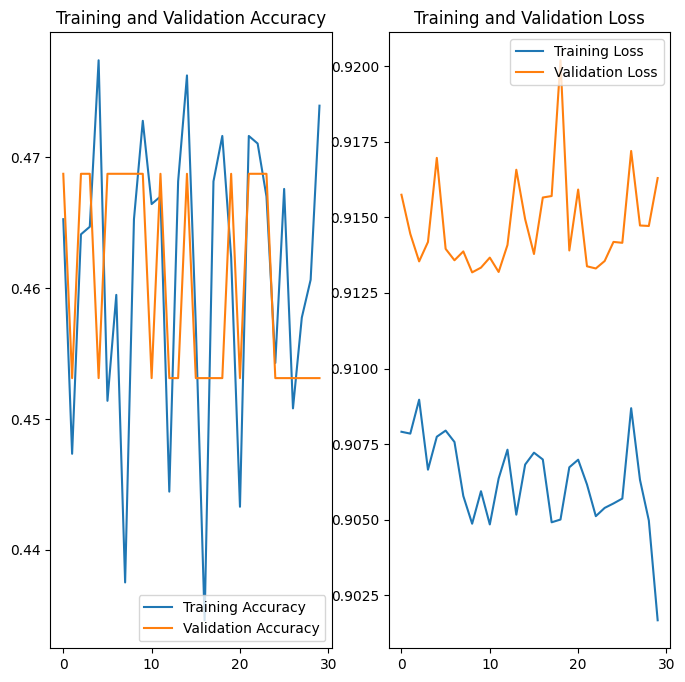

In [91]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(range(EPOCHS), acc_alexnet, label='Training Accuracy')
plt.plot(range(EPOCHS), val_acc_alexnet, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(range(EPOCHS), loss_alexnet, label='Training Loss')
plt.plot(range(EPOCHS), val_loss_alexnet, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


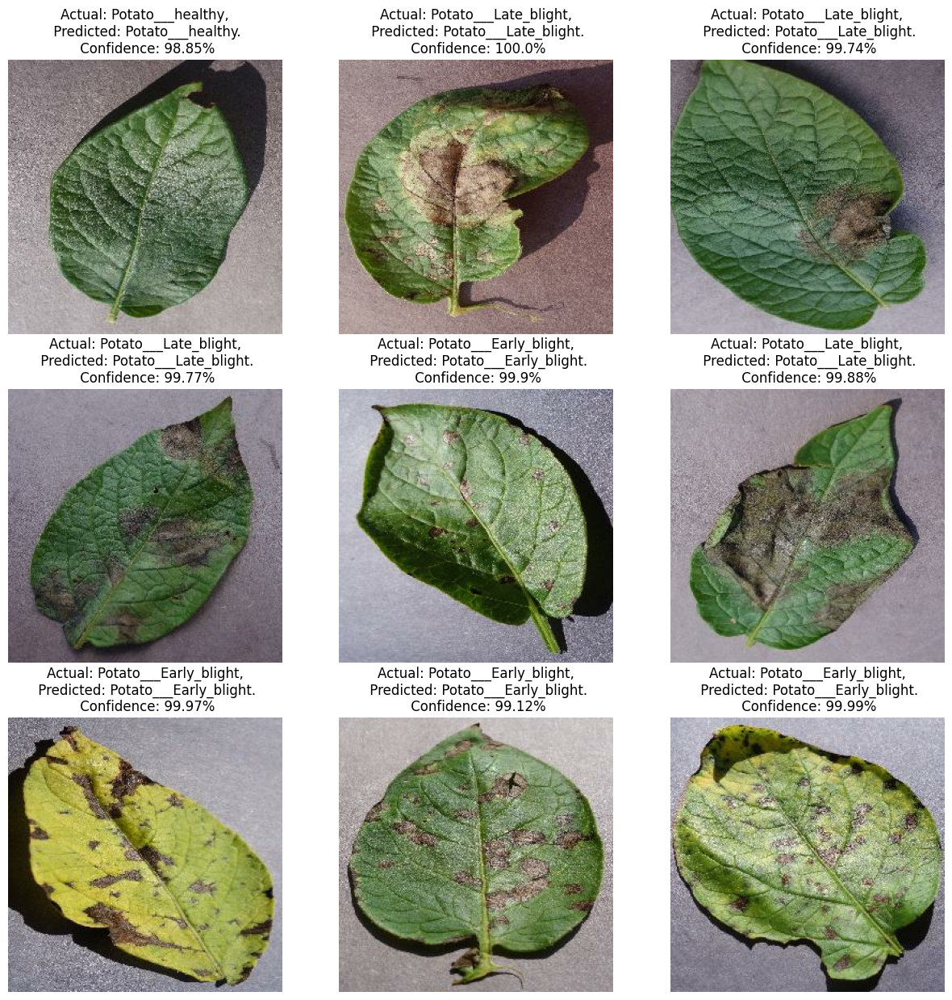

In [95]:
plt.figure(figsize=(15, 15))
for images, labels in test_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        
        predicted_class, confidence = predict(model_alexnet, images[i].numpy())
        actual_class = class_names[labels[i]] 
        
        plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class}.\n Confidence: {confidence}%")
        plt.axis("off")

In [93]:
model_alexnet.save("alexnet_model.keras")


## GoogLeNet

In [146]:

def inception_module(x, filters_1x1, filters_3x3_reduce, filters_3x3, filters_5x5_reduce, filters_5x5, filters_pool_proj):
    path1 = layers.Conv2D(filters_1x1, (1, 1), padding='same', activation='relu')(x)
    path2 = layers.Conv2D(filters_3x3_reduce, (1, 1), padding='same', activation='relu')(x)
    path2 = layers.Conv2D(filters_3x3, (3, 3), padding='same', activation='relu')(path2)
    path3 = layers.Conv2D(filters_5x5_reduce, (1, 1), padding='same', activation='relu')(x)
    path3 = layers.Conv2D(filters_5x5, (5, 5), padding='same', activation='relu')(path3)
    path4 = layers.MaxPooling2D((3, 3), strides=(1, 1), padding='same')(x)
    path4 = layers.Conv2D(filters_pool_proj, (1, 1), padding='same', activation='relu')(path4)
    return layers.concatenate([path1, path2, path3, path4], axis=3)

input_tensor = layers.Input(shape=(256, 256, 3))
x = resize_and_rescale(input_tensor)
x = inception_module(x, 8, 16, 32, 4, 16, 16)
x = layers.MaxPooling2D((3, 3))(x)  # Additional pooling to reduce dimensions before flattening
x = layers.Flatten()(x)
x = layers.Dense(, activation='relu')(x)
x = layers.Dropout(0.5)(x)
output = layers.Dense(3, activation='softmax')(x)

model_googlenet = models.Model(inputs=input_tensor, outputs=output)


In [147]:
model_googlenet.build(input_shape=(BATCH_SIZE, IMAGE_SIZE, IMAGE_SIZE, CHANNELS))


In [148]:
model_googlenet.summary()


Model: "functional_26"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                  ┃ Output Shape              ┃         Param # ┃ Connected to               ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_31 (InputLayer)   │ (None, 256, 256, 3)       │               0 │ -                          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ sequential (Sequential)       │ (None, 256, 256, 3)       │               0 │ input_layer_31[0][0]       │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2d_160 (Conv2D)           │ (None, 256, 256, 16)      │              64 │ sequential[28][0]          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2d_162 (Conv2D)           │ (None, 256, 256, 4)       │              16 │ sequential[28][0]          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ max_pooling2d_50              │ (None, 256, 256, 3)       │               0 │ sequential[28][0]          │
│ (MaxPooling2D)                │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2d_159 (Conv2D)           │ (None, 256, 256, 8)       │              32 │ sequential[28][0]          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2d_161 (Conv2D)           │ (None, 256, 256, 32)      │           4,640 │ conv2d_160[0][0]           │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2d_163 (Conv2D)           │ (None, 256, 256, 16)      │           1,616 │ conv2d_162[0][0]           │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2d_164 (Conv2D)           │ (None, 256, 256, 16)      │              64 │ max_pooling2d_50[0][0]     │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ concatenate_23 (Concatenate)  │ (None, 256, 256, 72)      │               0 │ conv2d_159[0][0],          │
│                               │                           │                 │ conv2d_161[0][0],          │
│                               │                           │                 │ conv2d_163[0][0],          │
│                               │                           │                 │ conv2d_164[0][0]           │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ max_pooling2d_51              │ (None, 85, 85, 72)        │               0 │ concatenate_23[0][0]       │
│ (MaxPooling2D)                │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ flatten_28 (Flatten)          │ (None, 520200)            │               0 │ max_pooling2d_51[0][0]     │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ dense_47 (Dense)              │ (None, 1)                 │         520,201 │ flatten_28[0][0]           │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ dropout_13 (Dropout)          │ (None, 1)                 │               0 │ dense_47[0][0]             │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ dense_48 (Dense)              │ (None, 3)                 │               

 Total params: 526,639 (2.01 MB)

 Trainable params: 526,639 (2.01 MB)

 Non-trainable params: 0 (0.00 B)

In [149]:
model_googlenet.compile(optimizer='adam',
                                                loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),

                        metrics=['accuracy'])

In [150]:
history_googlenet = model_googlenet.fit(
    train_ds,
    validation_data=val_ds,
    epochs=5,
    batch_size=32,  # Note: Batch size is often handled in the dataset, might not be needed here
    verbose=1
)

Epoch 1/5
54/54 ━━━━━━━━━━━━━━━━━━━━ 441s 8s/step - accuracy: 0.4390 - loss: 1.0928 - val_accuracy: 0.4531 - val_loss: 1.0756
Epoch 2/5
54/54 ━━━━━━━━━━━━━━━━━━━━ 63s 1s/step - accuracy: 0.4550 - loss: 1.0699 - val_accuracy: 0.4688 - val_loss: 1.0548
Epoch 3/5
54/54 ━━━━━━━━━━━━━━━━━━━━ 64s 1s/step - accuracy: 0.4458 - loss: 1.0495 - val_accuracy: 0.4688 - val_loss: 1.0370
Epoch 4/5
54/54 ━━━━━━━━━━━━━━━━━━━━ 63s 1s/step - accuracy: 0.4580 - loss: 1.0293 - val_accuracy: 0.4531 - val_loss: 1.0212
Epoch 5/5
54/54 ━━━━━━━━━━━━━━━━━━━━ 63s 1s/step - accuracy: 0.4713 - loss: 1.0136 - val_accuracy: 0.4531 - val_loss: 1.0076


In [151]:
# Evaluate the GoogLeNet model on the test dataset
scores_googlenet = model_googlenet.evaluate(test_ds)
print("Test Loss, Test Accuracy:", scores_googlenet)

8/8 ━━━━━━━━━━━━━━━━━━━━ 3s 361ms/step - accuracy: 0.4214 - loss: 1.0078
Test Loss, Test Accuracy: [1.0093369483947754, 0.43359375]


In [152]:
# Display training parameters and access the training history for GoogLeNet
print("Training parameters: ", history_googlenet.params)
print("Available history keys: ", history_googlenet.history.keys())
print("Type of loss history: ", type(history_googlenet.history['loss']))
print("Length of loss history: ", len(history_googlenet.history['loss']))
print("First 5 epochs' losses: ", history_googlenet.history['loss'][:5])

acc_googlenet = history_googlenet.history['accuracy']
val_acc_googlenet = history_googlenet.history['val_accuracy']
loss_googlenet = history_googlenet.history['loss']
val_loss_googlenet = history_googlenet.history['val_loss']


Training parameters:  {'verbose': 1, 'epochs': 5, 'steps': 54}
Available history keys:  dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])
Type of loss history:  <class 'list'>
Length of loss history:  5
First 5 epochs' losses:  [1.086945652961731, 1.064376950263977, 1.0445369482040405, 1.0273160934448242, 1.012161135673523]


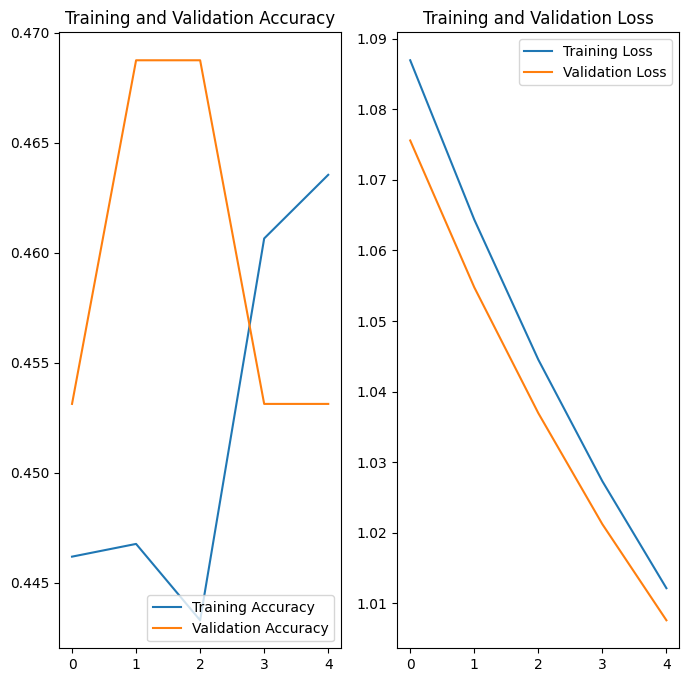

In [153]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(range(5), acc_googlenet, label='Training Accuracy')
plt.plot(range(5), val_acc_googlenet, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(range(5), loss_googlenet, label='Training Loss')
plt.plot(range(5), val_loss_googlenet, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


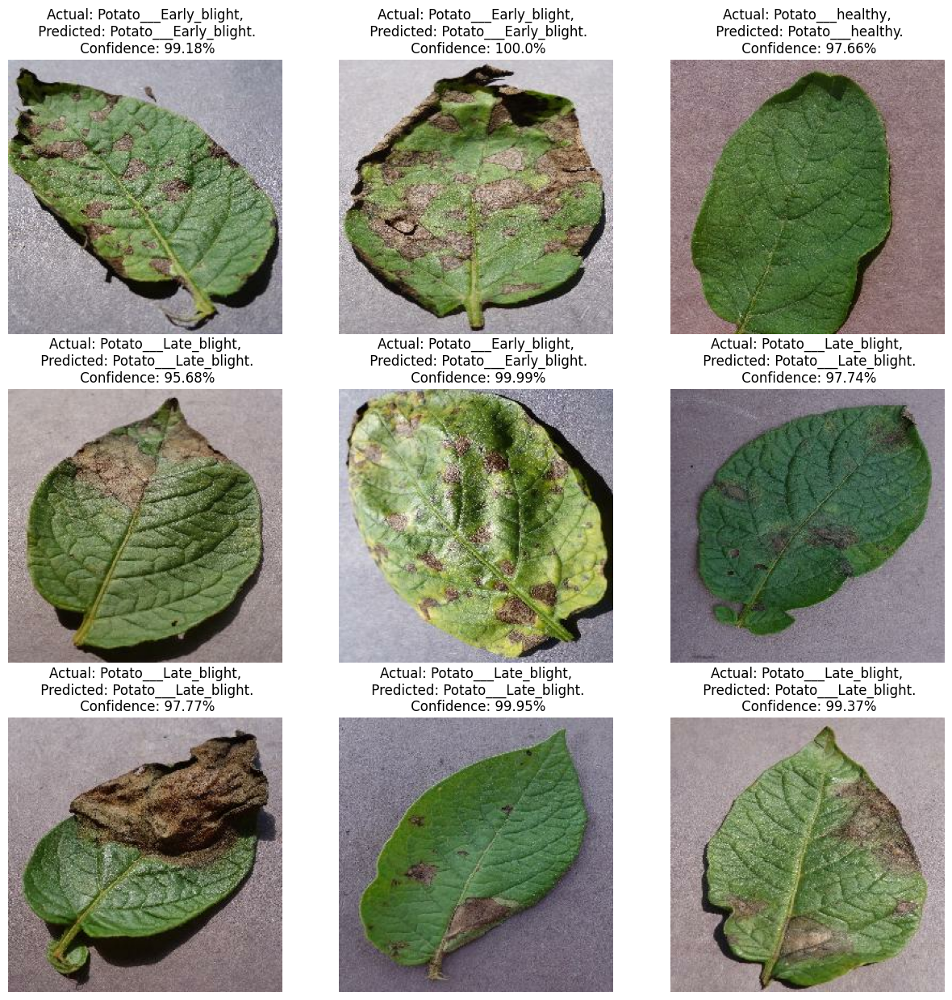

In [154]:
plt.figure(figsize=(15, 15))
for images, labels in test_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        
        predicted_class, confidence = predict(model_googlenet, images[i].numpy())
        actual_class = class_names[labels[i]] 
        
        plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class}.\n Confidence: {confidence}%")
        plt.axis("off")

In [155]:
model_googlenet.save("googlenet_model.keras")


## ResNet

In [101]:
# ResNet for (256, 256, 3) images
base_model_resnet = tf.keras.applications.ResNet50(
    include_top=False,
    weights=None,
    input_shape=(256, 256, 3),
    pooling='avg'
)

x = base_model_resnet.output
x = layers.Dense(1024, activation='relu')(x)
x = layers.Dropout(0.5)(x)
predictions = layers.Dense(3, activation='softmax')(x)

model_resnet = models.Model(inputs=base_model_resnet.input, outputs=predictions)


In [102]:
model_resnet.build(input_shape=(BATCH_SIZE, IMAGE_SIZE, IMAGE_SIZE, CHANNELS))


In [103]:
model_resnet.summary()


Model: "functional_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                  ┃ Output Shape              ┃         Param # ┃ Connected to               ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_15 (InputLayer)   │ (None, 256, 256, 3)       │               0 │ -                          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv1_pad (ZeroPadding2D)     │ (None, 262, 262, 3)       │               0 │ input_layer_15[0][0]       │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv1_conv (Conv2D)           │ (None, 128, 128, 64)      │           9,472 │ conv1_pad[0][0]            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv1_bn (BatchNormalization) │ (None, 128, 128, 64)      │             256 │ conv1_conv[0][0]           │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv1_relu (Activation)       │ (None, 128, 128, 64)      │               0 │ conv1_bn[0][0]             │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ pool1_pad (ZeroPadding2D)     │ (None, 130, 130, 64)      │               0 │ conv1_relu[0][0]           │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ pool1_pool (MaxPooling2D)     │ (None, 64, 64, 64)        │               0 │ pool1_pad[0][0]            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_1_conv (Conv2D)  │ (None, 64, 64, 64)        │           4,160 │ pool1_pool[0][0]           │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_1_bn             │ (None, 64, 64, 64)        │             256 │ conv2_block1_1_conv[0][0]  │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_1_relu           │ (None, 64, 64, 64)        │               0 │ conv2_block1_1_bn[0][0]    │
│ (Activation)                  │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_2_conv (Conv2D)  │ (None, 64, 64, 64)        │          36,928 │ conv2_block1_1_relu[0][0]  │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_2_bn             │ (None, 64, 64, 64)        │             256 │ conv2_block1_2_conv[0][0]  │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_2_relu           │ (None, 64, 64, 64)        │               0 │ conv2_block1_2_bn[0][0]    │
│ (Activation)                  │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_0_conv (Conv2D)  │ (None, 64, 64, 256)       │          16,640 │ pool1_pool[0][0]           │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_3_conv (Conv2D)  │ (None, 64, 64, 256)       │          16,640 │ conv2_block1_2_relu[0][0]  │
├───────────────────────────────┼───────────────────────────┼───────────────

 Total params: 25,688,963 (98.00 MB)

 Trainable params: 25,635,843 (97.79 MB)

 Non-trainable params: 53,120 (207.50 KB)

In [109]:
model_resnet.compile(optimizer='adam',
                        loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
 metrics=['accuracy'])

In [111]:
history_resnet = model_resnet.fit(
    train_ds,
    validation_data=val_ds,
    epochs=5,
    batch_size=32,  # Note: Batch size is often handled in the dataset, might not be needed here
    verbose=1
)

Epoch 1/5
54/54 ━━━━━━━━━━━━━━━━━━━━ 667s 12s/step - accuracy: 0.8231 - loss: 0.9107 - val_accuracy: 0.4271 - val_loss: 14443.9951
Epoch 2/5
54/54 ━━━━━━━━━━━━━━━━━━━━ 558s 10s/step - accuracy: 0.8198 - loss: 0.6480 - val_accuracy: 0.5000 - val_loss: 17.5251
Epoch 3/5
54/54 ━━━━━━━━━━━━━━━━━━━━ 553s 10s/step - accuracy: 0.8850 - loss: 0.2834 - val_accuracy: 0.7708 - val_loss: 0.5585
Epoch 4/5
54/54 ━━━━━━━━━━━━━━━━━━━━ 552s 10s/step - accuracy: 0.9431 - loss: 0.1573 - val_accuracy: 0.9375 - val_loss: 0.1666
Epoch 5/5
54/54 ━━━━━━━━━━━━━━━━━━━━ 3458s 65s/step - accuracy: 0.9438 - loss: 0.1632 - val_accuracy: 0.9323 - val_loss: 0.2241


In [113]:
# Evaluate the ResNet model on the test dataset
scores_resnet = model_resnet.evaluate(test_ds)
print("Test Loss, Test Accuracy:", scores_resnet)


8/8 ━━━━━━━━━━━━━━━━━━━━ 18s 2s/step - accuracy: 0.8970 - loss: 0.3865
Test Loss, Test Accuracy: [0.41540074348449707, 0.8984375]


In [114]:
# Display training parameters and access the training history for ResNet
print("Training parameters: ", history_resnet.params)
print("Available history keys: ", history_resnet.history.keys())
print("Type of loss history: ", type(history_resnet.history['loss']))
print("Length of loss history: ", len(history_resnet.history['loss']))
print("First 5 epochs' losses: ", history_resnet.history['loss'][:5])

acc_resnet = history_resnet.history['accuracy']
val_acc_resnet = history_resnet.history['val_accuracy']
loss_resnet = history_resnet.history['loss']
val_loss_resnet = history_resnet.history['val_loss']


Training parameters:  {'verbose': 1, 'epochs': 5, 'steps': 54}
Available history keys:  dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])
Type of loss history:  <class 'list'>
Length of loss history:  5
First 5 epochs' losses:  [1.3432583808898926, 0.5451750159263611, 0.23123043775558472, 0.15687020123004913, 0.1502588987350464]


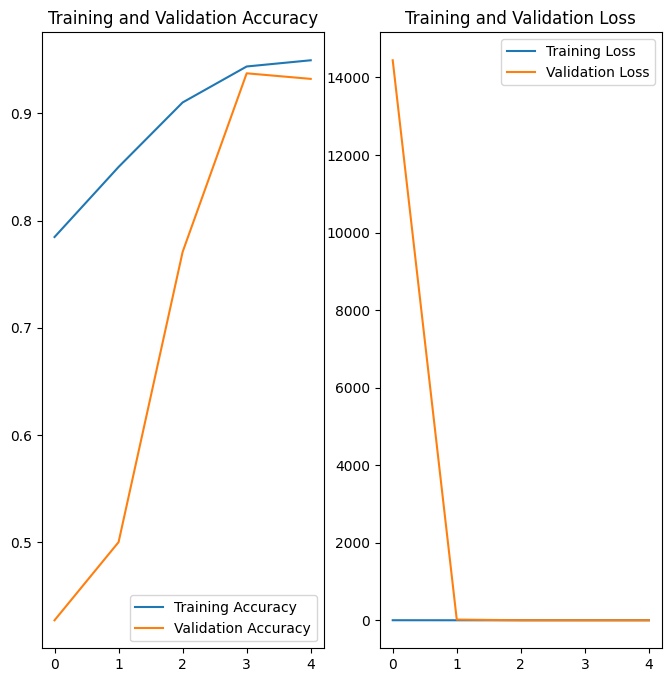

In [117]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(range(5), acc_resnet, label='Training Accuracy')
plt.plot(range(5), val_acc_resnet, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(range(5), loss_resnet, label='Training Loss')
plt.plot(range(5), val_loss_resnet, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


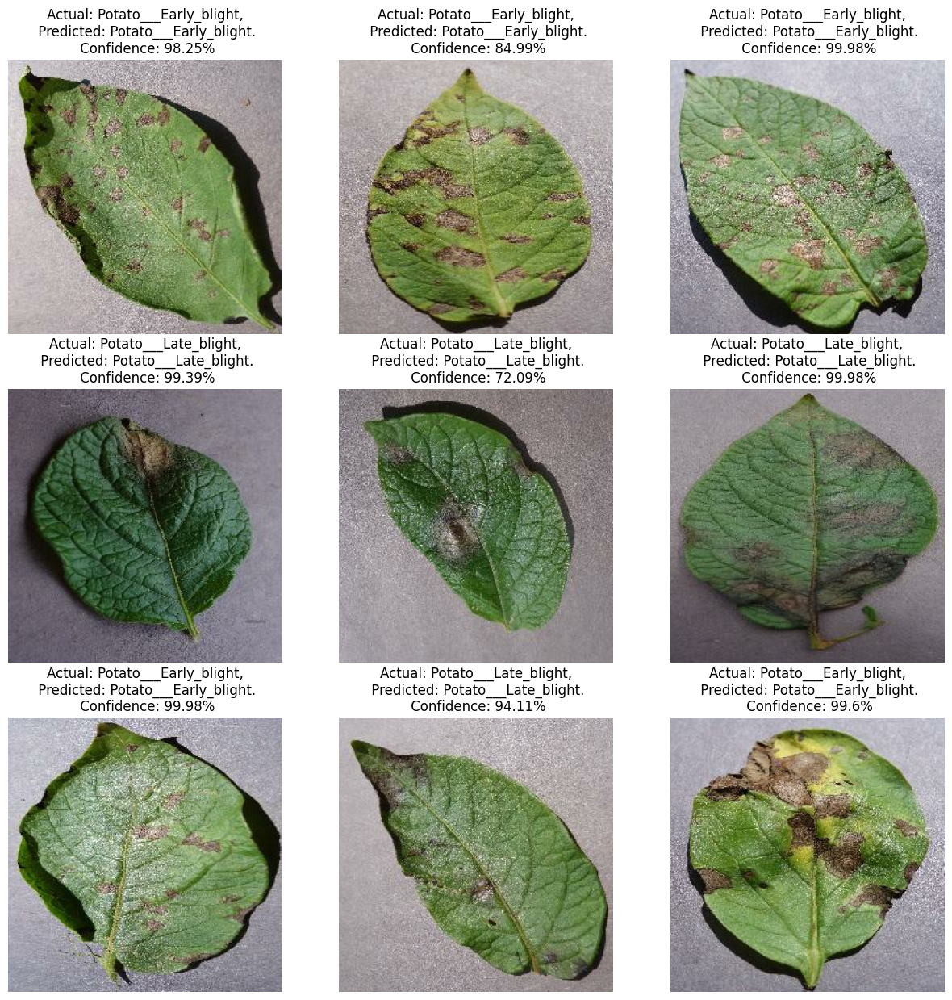

In [118]:
plt.figure(figsize=(15, 15))
for images, labels in test_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        
        predicted_class, confidence = predict(model_resnet, images[i].numpy())
        actual_class = class_names[labels[i]] 
        
        plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class}.\n Confidence: {confidence}%")
        plt.axis("off")

In [119]:
model_resnet.save("resnet_model.keras")

In [ ]:
from tensorflow.keras import layers, models

def inception_module(x, filters_1x1, filters_3x3_reduce, filters_3x3, filters_5x5_reduce, filters_5x5, filters_pool_proj):
    path1 = layers.Conv2D(filters_1x1, (1, 1), padding='same', activation='relu')(x)
    path2 = layers.Conv2D(filters_3x3_reduce, (1, 1), padding='same', activation='relu')(x)
    path2 = layers.Conv2D(filters_3x3, (3, 3), padding='same', activation='relu')(path2)
    path3 = layers.Conv2D(filters_5x5_reduce, (1, 1), padding='same', activation='relu')(x)
    path3 = layers.Conv2D(filters_5x5, (5, 5), padding='same', activation='relu')(path3)
    path4 = layers.MaxPooling2D((3, 3), strides=(1, 1), padding='same')(x)
    path4 = layers.Conv2D(filters_pool_proj, (1, 1), padding='same', activation='relu')(path4)
    return layers.concatenate([path1, path2, path3, path4], axis=3)

input_tensor = layers.Input(shape=(256, 256, 3))
x = resize_and_rescale(input_tensor)
x = inception_module(x, 8, 16, 32, 4, 16, 16)
x = layers.GlobalAveragePooling2D()(x)  # Global average pooling
x = layers.Dense(128, activation='relu')(x)  # Adjust the number of units as needed
x = layers.Dropout(0.5)(x)
output = layers.Dense(3, activation='softmax')(x)

model_googlenet = models.Model(inputs=input_tensor, outputs=output)